# Road Graphing

### GPU Configurations

In [1]:
import os                                        # Operating system-related functions (file, directory operations)
import sys                                       # Provides access to system-specific parameters and functions
import platform                                  # Provides functions and information about the operating system and hardware
import warnings                                  # Suppress warnings

import numpy as np                               # numerical operations & array manipulation
import pickle                                    # for object serialization & deserialization
import random                                    # generates random numbers
import math

import cv2                                       # computer vision & image processing
import tensorflow as tf                          # deep learning framework
import keras                                     # training & evaluating deep learning models
import itertools                                 # combinations & permutations

from skimage.io import imread                    # reading images
from skimage.io import imshow                    # displaying images
from tqdm import tqdm                            # creating progress bars in loops
from typing import Dict                          # type hinting
from typing import List                          # type hinting
from typing import Tuple                         # type hinting
from typing import Optional                      # type hinting
import matplotlib.pyplot as plt                  # creating plots & visualizations

import networkx as nx                            # graph-based data structures & algorithms
from skimage.morphology import skeletonize       # image skeletonization
from skimage.measure import label                # connected component labeling
from skimage.draw import line                    # drawing straight lines in images
from PIL import Image                            # image manipulation & loading
import seaborn as sns
import pandas as pd

In [2]:
# Check Operating System & Platform
print('Operating System:', platform.system(), platform.release())
print('Python Platform:', platform.platform())

# Check Python Version
print('Python Version:', sys.version)
print()

# Print library versions
print('NumPy Version:', np.__version__)
print('OpenCV Version:', cv2.__version__)
print('TensorFlow Version:', tf.__version__)
print('Keras Version:', keras.__version__)
print()

# Check if any GPU is available
print('GPU is Available:', len(tf.config.list_physical_devices('GPU')) > 0)
print('Number of GPUs Available:', len(tf.config.list_physical_devices('GPU')))

Operating System: Darwin 23.3.0
Python Platform: macOS-14.3.1-arm64-arm-64bit
Python Version: 3.11.5 (main, Sep 11 2023, 08:31:25) [Clang 14.0.6 ]

NumPy Version: 1.24.3
OpenCV Version: 4.9.0
TensorFlow Version: 2.15.0
Keras Version: 2.15.0

GPU is Available: False
Number of GPUs Available: 0


In [3]:
gpus = tf.config.list_physical_devices('GPU')
if gpus:
    try:
        # Set memory limit for the first GPU to 0.31
        gpu_memory_limit = 0.30
        tf.config.experimental.set_virtual_device_configuration(
            gpus[0],
            [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=int(gpu_memory_limit * 1024))]
        )
        logical_gpus = tf.config.list_logical_devices('GPU')
        print(len(gpus), 'Physical GPUs,', len(logical_gpus), 'Logical GPUs')
    except RuntimeError as e:
        # Memory limit must be set before GPUs have been initialized
        print(e)

#### Create Directories

The directory containing the dataset used in this notebook is  **'../datasets/deepglobe/train'**. Create directories from the dataset's directory for the training, validation, and test data (if they do not exist). Additionally, create a directory to store pickled Numpy arrays for later usage.

In [4]:
# Directory containing dataset
dataset_dir = '../datasets/deepglobe/train'

# Directories containing 128x128 tiles of  images & masks
train_dir = os.path.join(dataset_dir, 'train')
validation_dir = os.path.join(dataset_dir, 'validation')
test_dir = os.path.join(dataset_dir, 'test')
pickel_dir = os.path.join(dataset_dir, 'pickle')

# Directories containing original 1024x1024 images & masks
orig_train_dir      = os.path.join(dataset_dir, 'original_train')
orig_validation_dir = os.path.join(dataset_dir, 'original_validation')
orig_test_dir       = os.path.join(dataset_dir, 'original_test')
orig_pickel_dir     = os.path.join(dataset_dir, 'original_pickle')

## Plot Image Grid

* plot_image_grid(image_dir: str, image_name: str, rows: int = 4, cols: int = 4) -> None:


In [5]:
# List all satellite images in the dataset directory
mask_extensions = ['.png']
mask_filenames = [filename for filename in os.listdir(train_dir) if os.path.splitext(filename)[-1] in mask_extensions]

# Set random seed: 0
random.seed(0)
# Shuffle the files randomly
random.shuffle(mask_filenames)
mask_filenames[0]

'492923_mask_tile_0.png'

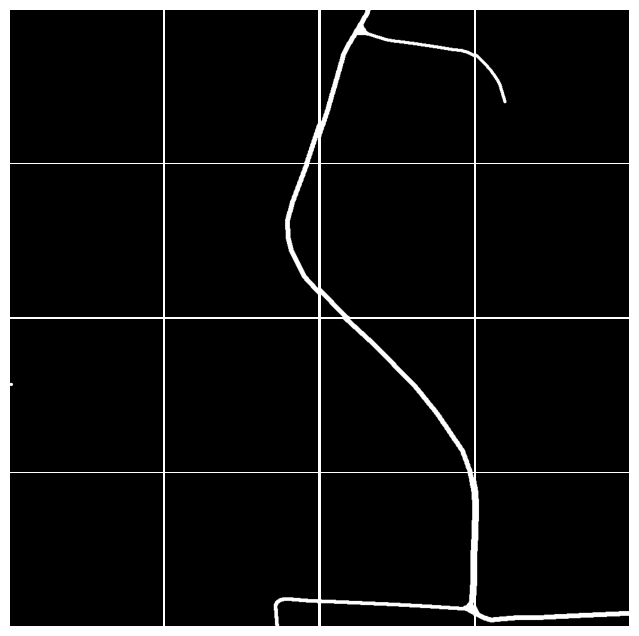

In [6]:
def plot_image_grid(image_dir: str, image_name: str, rows: int = 4, cols: int = 4) -> None:
    '''
    Plot a grid of images from a directory based on a specified image name format.

    Args:
        image_dir (str): The directory where image tiles are located.
        image_name (str): The base image name without index or extension (e.g., '492923_mask_tile_0.png').
        rows (int, optional): Number of rows in the grid. Defaults to 4.
        cols (int, optional): Number of columns in the grid. Defaults to 4.

    Returns:
        None
    '''
    # Create a subplot grid
    fig, axes = plt.subplots(rows, cols, figsize=(8, 8))

    # Remove trailing '0.png' from the displayed label
    image_name = image_name.rstrip('0.png')

    # Iterate through the grid
    for i in range(rows):
        for j in range(cols):
            # Construct the filename for the current tile
            index = i * cols + j
            filename = f'{image_name}{index}.png'
            file_path = os.path.join(image_dir, filename)

            # Load and plot the image
            if os.path.exists(file_path):
                image = Image.open(file_path)
                axes[i, j].imshow(image, cmap='gray')
                axes[i, j].axis('off')

    # Adjust spacing between subplots
    plt.subplots_adjust(wspace=0.01, hspace=0.01)

    # Display the combined image
    plt.show()

# Example usage:
plot_image_grid(train_dir, '492923_mask_tile_0.png')

#### Metric Functions

In [7]:
from scipy.spatial.distance import euclidean
from heapq import heappush, heappop
from skimage.morphology import skeletonize
from scipy.spatial import cKDTree

# Point Type (coordinates)
Point = Tuple[float, float]

def euclidean_distance(u, v):
    '''Calculate Euclidean distance between two points.'''
    return euclidean(u, v)

def create_road_network_graph_optimized(road_network: np.ndarray, distance_threshold: float = 1.5) -> nx.Graph:
    skeleton = skeletonize(road_network.astype(int))
    graph = nx.Graph()

    # Extract nodes
    nodes = np.argwhere(skeleton == 1)
    
    # Use cKDTree for efficient spatial queries
    tree = cKDTree(nodes)
    
    # Add nodes to the graph
    for node in nodes:
        graph.add_node(tuple(node))
    
    # Efficiently find and add edges based on distance threshold
    for node in nodes:
        distances, indices = tree.query(node, k=500, distance_upper_bound=distance_threshold)
        for distance, index in zip(distances, indices):
            if index != len(nodes) and tuple(nodes[index]) != tuple(node):
                graph.add_edge(tuple(node), tuple(nodes[index]))
    
    return graph

def create_road_network_graph(road_network: np.ndarray, distance_threshold: float = 1.5) -> nx.Graph:
    '''
    Create a road network graph from an image.

    Args:
        road_network (np.ndarray): The image representing the road network.
        distance_threshold (float): Maximum distance (in pixels) for nodes to be considered neighbors.

    Returns:
        nx.Graph: The road network graph.
    '''
    # Convert to skeleton to extract centerline of roads
    skeleton = skeletonize(road_network.astype(int))
    
    # Create a NetworkX graph
    graph = nx.Graph()

    # Iterate over skeleton pixels and add them as nodes
    for r in range(0, skeleton.shape[0], 1):
        for c in range(0, skeleton.shape[1], 1):
            if skeleton[r, c] == 1 or skeleton[r, c] == True:
                graph.add_node((r, c))

    # Iterate over nodes and add edges
    for node1 in graph.nodes():
        for node2 in graph.nodes():
            if node1 != node2:
                distance = euclidean_distance(node1, node2)
                if distance <= distance_threshold:
                    graph.add_edge(node1, node2)

    return graph

def contracting_nodes(graph, degree_threshold=2, min_distance=30):
    '''
    Contract nodes in a graph based on a given threshold and minimum distance.

    Args:
        graph (nx.Graph): The input graph.
        degree_threshold (float): The threshold for node contraction.
        min_distance (float): Minimum distance from a contracted node.

    Returns:
        nx.Graph: The contracted graph.
    '''
    contracted_graph = graph.copy()
    nodes_to_not_contract = []

    # Continue contracting nodes until no node has a degree greater than the threshold
    while True:
        degrees = dict(contracted_graph.degree())

        # Find nodes to contract
        nodes_to_contract = [node for node, degree in degrees.items() if degree == degree_threshold and node not in nodes_to_not_contract]

        # if all nodes are spaced min_distance apart or there is enough contraction
        if not nodes_to_contract:
            break
        
        # Contract nodes unless nodes' distance > the minimum distance
        for node in nodes_to_contract:
            neighbors = list(contracted_graph.neighbors(node))
            if len(neighbors) == 2:
                u, v = neighbors
                
                # Check the distance between contracted node and its neighbors
                if euclidean_distance(u, v) <= min_distance:
                    contracted_graph = nx.contracted_edge(contracted_graph, (u, node), self_loops=False)
                else:
                    nodes_to_not_contract.extend([node])

    return contracted_graph

def contract_graph(G, min_distance=30):
    contracted = True
    while contracted:
        contracted = False
        for node in list(G.nodes):
            if G.degree(node) == 2:
                # Directly use node coordinates
                neighbors = list(G.neighbors(node))
                if len(neighbors) != 2:
                    continue  # Skip if the node doesn't have exactly two neighbors
                
                # Calculate the distance between the two neighbors
                dist = euclidean_distance(neighbors[0], neighbors[1])
                if dist <= min_distance:
                    # If the distance exceeds min_distance, contract the node with one of its neighbors
                    G = nx.contracted_nodes(G, neighbors[0], node, self_loops=False)
                    contracted = True
                    break  # Restart since the graph structure changed
    
    return G

def find_nearest_node(graph: nx.Graph, point: Tuple[int, int], pixel_resolution: int = 50, max_distance: float = math.inf) -> Optional[int]:
    '''
    Find the nearest node in the graph to a given point.

    Args:
        graph (nx.Graph): The networkx graph.
        point (Tuple[float, float]): The coordinates of the input point (x, y).
        max_distance (float): The maximum distance to consider in metres. Defaults to positive infinity.
        pixel_resolution (int): Pixel resolution value in centimetres/pixel. Defaults to 50.

    Returns:
        Optional[float]: The nearest node in the graph, or None if no node is found within the maximum distance.
    '''
    nearest_node = None

    # Convert maximum distance to centimeters since pixel_resolution is in centimeters/pixel
    maximum_pixel_distance = max_distance * 100 / pixel_resolution
    
    for node in graph.nodes:
        pixel_distance = euclidean_distance(point, node)
        if pixel_distance < maximum_pixel_distance:
            nearest_node = node
            maximum_pixel_distance = pixel_distance
    return nearest_node

# Classify nodes to terminal or intersection points
def classify_road_segments(graph: nx.Graph) -> Tuple[List[Tuple[int, int]], List[Tuple[int, int]]]:
    '''
    Classify nodes in a road network graph into terminal nodes, intersection nodes, and line segments.

    Args:
        graph (nx.Graph): The road network graph.

    Returns:
        Tuple[List[Tuple[int, int]], List[Tuple[int, int]], List[List[Tuple[int, int]]]]:
            - terminal_nodes: List of terminal node coordinates (x, y).
            - intersection_nodes: List of intersection node coordinates (x, y).
    '''

    terminal_nodes = []
    intersection_nodes = []

    # Post-Processing:
    nodes_to_remove = set()  # Use a set to store nodes to remove
    edges_to_add = []        # List to store edges to add

    intermediate_nodes = set()
    nodes = list(graph.nodes())

    for node in nodes:
        neighbors = list(graph.neighbors(node))

        if len(neighbors) == 1:
            terminal_nodes.append(node)

        elif len(neighbors) > 2:
            intersection_nodes.append(node)

    return terminal_nodes, intersection_nodes

# Compute APLS metric
def apls(ground_truth_graph: nx.Graph, predicted_graph: nx.Graph, max_difference: int = 1) -> float:
    '''
    Calculate the APLS metric

    Parameters:
        ground_truth_graph (nx.Graph): The ground truth graph.
        predicted_graph (nx.Graph): The predicted graph.
        max_difference (int): Maximum difference allowed in the APLS metric. Defaults to 1.
    Returns:
        float: APLS score.

    The APLS metric is calculated based on the formula:
    C = 1 - 1 / N Σ min{1, | L(a,b) - L(a',b') | / L(a,b)}

    Where:
        - N is the number of shortest paths.
        - Node a' is the node in the predicted graph nearest to node a in the ground truth graph.
        - Node b' is the node in the predicted graph nearest to node b in the ground truth graph.
        - L(a, b) denotes a path distance in the ground truth graph.
        - L(a', b') denotes the path length between corresponding nodes in the predicted graph.
        - Max difference is the maximum proportional difference between paths.
    '''

    N = 0
    total_difference = 0

     # Filter terminal nodes for the ground truth graph
    terminal_nodes, intersection_node = classify_road_segments(ground_truth_graph)
    
    for node_a, node_b in itertools.combinations(terminal_nodes, 2):
        if node_a != node_b:
            # Find the corresponding nodes in the predicted graph a' and b'
            node_a_prime = find_nearest_node(predicted_graph, node_a)
            node_b_prime = find_nearest_node(predicted_graph, node_b)

            # Skip if no corresponding nodes ==> no proper path
            if node_a_prime is None or node_b_prime is None:
                N += 1
                total_difference += max_difference
                continue

            # Find the path length, L(a,b) in the ground truth graph
            try:
                shortest_path = nx.shortest_path(ground_truth_graph, node_a, node_b)
                L_a_b = sum(euclidean_distance(shortest_path[i], shortest_path[i+1]) for i in range(len(shortest_path) - 1))
            except (nx.NetworkXNoPath, KeyError):
                L_a_b = None

            # Find the path length, L(a',b') in the predicted graph
            try:
                shortest_path = nx.shortest_path(predicted_graph, source=node_a_prime, target=node_b_prime)
                L_a_prime_b_prime = sum(euclidean_distance(shortest_path[i], shortest_path[i+1]) for i in range(len(shortest_path) - 1))
            except (nx.NetworkXNoPath, KeyError):
                L_a_prime_b_prime = None

            # Handle the case when there are no paths
            if L_a_b is not None and L_a_prime_b_prime is not None:
                proportional_difference = abs(L_a_b - L_a_prime_b_prime) / L_a_b
                difference = min(max_difference, proportional_difference)
            elif L_a_b is None and L_a_prime_b_prime is None:
                continue
            else:
                difference = max_difference
                
            # Increment
            N += 1
            total_difference += difference

    # Calculate APLS score
    apls = 1 - total_difference / N if N > 0 else 0
    apls = round(apls, 4)

    return apls

# Calculate the angle of an edge relative to the x-axis
def angle_relative_to_x_axis(edge_coords: Tuple[Point, Point]) -> float:
    '''
    Calculates the angle of an edge relative to the x-axis.

    Args:
        edge_coords (Tuple[Point, Point]): Tuple of edge coordinates.

    Returns:
        float: Angle of the edge relative to the x-axis.
    '''
    delta_x = edge_coords[1][0] - edge_coords[0][0]
    delta_y = edge_coords[1][1] - edge_coords[0][1]

    angle_radians = math.atan2(delta_y, delta_x)
    angle_degrees = math.degrees(angle_radians)
    angle_degrees_positive = angle_degrees % 360

    return round(angle_degrees_positive, 2)

# Check edges orientation between two graphs at specific nodes
def check_edges_orientation(graph_A: nx.Graph, graph_B: nx.Graph, node_A: int, nearest_node_B: Optional[int], min_angle: float = 10) -> bool:
    '''
    Checks the orientation of edges between two graphs at specific nodes.

    Args:
        graph_A (nx.Graph): Networkx graph as reference.
        graph_B (nx.Graph): Networkx graph for comparison.
        node_A (int): Node in graph A.
        nearest_node_B (Optional[int]): Nearest node in graph B to node_A.
        min_angle (float): Minimum acceptable angle difference. Defaults to 10.

    Returns:
        bool: True if edges' orientations are within the specified angle, False otherwise.
    '''
    edges_A = list(graph_A.edges(node_A))
    edges_B = list(graph_B.edges(nearest_node_B)) if nearest_node_B is not None else []

    if len(edges_A) == len(edges_B):
        for edge_A, edge_B in zip(edges_A, edges_B):
            angle_A = angle_relative_to_x_axis(edge_A)
            angle_B = angle_relative_to_x_axis(edge_B)

            if not abs(angle_A - angle_B) <= min_angle:
                return False
    else:
        return False

    return True

# Compute TOPO metric
def TOPO(ground_truth_graph: nx.Graph, predicted_graph: nx.Graph) -> Tuple[float, float, float]:
    '''
    Computes the TOPO metric, including precision, recall, and F1 score.

    Parameters:
        ground_truth_graph (Graph): The ground truth graph.
        predicted_graph (Graph): The predicted graph.

    Returns:
        Tuple[float, float, float]: Precision, recall, and F1 score.
    '''
    TP = 0 # true positives
    FP = 0 # false positives
    FN = 0 # false negatives

    # Iterating through nodes in the ground truth graph
    for node in ground_truth_graph.nodes():
        nearest_node = find_nearest_node(predicted_graph, node)

        if nearest_node is not None:
            if check_edges_orientation(ground_truth_graph, predicted_graph, node, nearest_node):
                TP += 1
            else:
                FN += 1
        else:
            FN += 1

    # Iterating through nodes in the predicted graph
    for node in predicted_graph.nodes():
        nearest_node = find_nearest_node(ground_truth_graph, node)

        if nearest_node is not None:
            if not check_edges_orientation(predicted_graph, ground_truth_graph, node, nearest_node):
                FP += 1
        else:
            FP += 1

    # Precision = TP / (TP + FP)
    # Recall = TP / (TP + FN)
    precision = TP / (TP + FP) if (TP + FP) > 0 else 0
    recall = TP / (TP + FN) if (TP + FN) > 0 else 0
    f1 = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0

    precision = round(precision, 4)
    recall = round(recall, 4)
    f1 = round(f1, 4)

    return precision, recall, f1

#### Plotting Road Networks

In [8]:
def plot_road_network_overlay(
    image, 
    graph: nx.Graph, 
    terminal_nodes: List[Tuple[int, int]], 
    intersection_nodes: List[Tuple[int, int]], 
    figsize: Tuple[int, int] = (8, 8), 
    node_size: int = 50
) -> None:
    '''
    Plot the road network graph overlay on the provided mask image with terminal and intersection nodes highlighted.

    Args:
        image: The image to overlay the graph on.
        graph (nx.Graph): The road network graph.
        terminal_nodes (list): List of terminal node coordinates (x, y).
        intersection_nodes (list): List of intersection node coordinates (x, y).
        figsize (tuple): Figure size (width, height). Defaults to (8, 8).
        node_size (int): Node size for plotting. Defaults to 50.
    
    Returns:
        None
    '''
    # Plot the original road mask
    plt.figure(figsize=figsize)
    plt.imshow(image, cmap='gray')

    # Define positions for graph nodes for plotting (swapping x and y coordinates)
    pos = {node: (node[1], node[0]) for node in graph.nodes()}

    # Overlay the graph on the mask
    nx.draw(graph, pos, node_size=node_size, node_color='#FFFF00', edge_color='#FFFF00', alpha=0.9)

    # Plot terminal nodes in green and intersection nodes in red
    nx.draw_networkx_nodes(graph, pos, nodelist=terminal_nodes, node_color='red', node_size=2*node_size)
    nx.draw_networkx_nodes(graph, pos, nodelist=intersection_nodes, node_color='#39FF14', node_size=2*node_size)

    plt.title('Overlay of Road Network Graph on Image')
    plt.show()

def plot_road_network_graph(
    graph: nx.Graph, 
    terminal_nodes: List[Tuple[int, int]], 
    intersection_nodes: List[Tuple[int, int]], 
    figsize: Tuple[int, int] = (8, 8), 
    node_size: int = 50
) -> None:
    '''
    Plot the road network graph with terminal and intersection nodes highlighted.

    Args:
        graph (nx.Graph): The road network graph.
        terminal_nodes (list): List of terminal node coordinates (x, y).
        intersection_nodes (list): List of intersection node coordinates (x, y).
        figsize (tuple): Figure size (width, height). Defaults to (8, 8).
        node_size (int): Node size for plotting. Defaults to 50.

    Returns:
        None
    '''
    # Create a plot
    plt.figure(figsize=figsize)

    # Define positions for graph nodes for plotting (swapping x and y coordinates)
    pos = {node: (node[1], node[0]) for node in graph.nodes()}

    # Plot the graph
    nx.draw(graph, pos, node_size=node_size, node_color='blue', edge_color='yellow', alpha=0.8)

    # Plot terminal nodes in green and intersection nodes in red
    nx.draw_networkx_nodes(graph, pos, nodelist=terminal_nodes, node_color='red', node_size=node_size)
    nx.draw_networkx_nodes(graph, pos, nodelist=intersection_nodes, node_color='#FAC898', node_size=node_size)

    plt.title('Road Network Graph')
    plt.show()


In [9]:
def combine_arrays(arrays, rows=4, cols=4):
    tile_height, tile_width = arrays[0].shape
    combined_image = np.zeros((rows * tile_height, cols * tile_width), dtype=np.float32)
    for i, array in enumerate(arrays):
        row = i // cols
        col = i % cols
        combined_image[row*tile_height:(row+1)*tile_height, col*tile_width:(col+1)*tile_width] = array
    return combined_image


## Validation

In [10]:
with open(os.path.join(pickel_dir, 'X_validation_128.pkl'), 'rb') as f:
    X_validation = pickle.load(f)

with open(os.path.join(pickel_dir, 'y_validation_128.pkl'), 'rb') as f:
    y_validation = pickle.load(f)

In [11]:
%%script echo
from keras.models import load_model

IMG_WIDTH = IMG_HEIGHT = 128

loaded_model = load_model('unet_model_1_epoch15.h5')

datasets = [('Train', X_validation, y_validation)]
# Generate predictions for all validation images
predicted_masks = []
for idx in range(len(X_validation)):
    pred_image = X_validation[idx].astype(np.float32).reshape((1, IMG_WIDTH, IMG_HEIGHT, 3))
    prediction = loaded_model.predict(pred_image)
    predicted_masks.append(prediction.squeeze())  # Remove batch dimension

unet_predicted_masks = np.array(predicted_masks)  # Convert list to NumPy array if not already

# Define the path to save the masks
predicted_masks_path = 'unet_predicted_masks.npy'

# Save the predicted masks
np.save(predicted_masks_path, unet_predicted_masks)


%%script echo
unet_predicted_masks = np.load('unet_predicted_masks.npy')
mask = unet_predicted_masks[0:0+16]
mask_group = np.array(mask)
combined_mask = combine_arrays(mask_group, 4, 4)
plt.imshow(combined_mask, cmap='gray')

In [12]:
%%script echo
ground_truth_masks = y_validation

predicted_mask_groups = []
gt_mask_groups = []

for i in range(0, len(ground_truth_masks), 16):
    # Combine every 16 masks for predictions and ground truth
    mask_group = np.array(unet_predicted_masks[i:i+16])
    gt_mask_group = np.squeeze(ground_truth_masks[i:i+16], axis=-1)
    
    combined_mask = combine_arrays(mask_group, 4, 4)
    combined_gt_mask = combine_arrays(gt_mask_group, 4, 4)

    predicted_mask_groups.append(combined_mask)
    gt_mask_groups.append(combined_gt_mask)

np.save('predicted_mask_group', predicted_mask_groups)
np.save('gt_mask_group', gt_mask_groups)

In [13]:
%%script echo
predicted_mask_groups = np.load('predicted_mask_group.npy')
gt_mask_groups = np.load('gt_mask_group.npy')

# Generate a list of thresholds
thresholds = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
apls_scores = []
topo_scores = []

# Apply each threshold to the predicted masks and evaluate
for threshold in thresholds:
    binarized_predicted_masks = [(mask > threshold).astype(np.float32) for mask in predicted_mask_groups]
    
    # Initialize score lists for this threshold
    threshold_apls_scores = []
    threshold_topo_scores = []
    
    # Iterate over binarized_predicted_masks and ground_truth_masks in pairs
    for i in range(0, len(gt_mask_groups)):
        combined_mask = binarized_predicted_masks[i]
        graph = create_road_network_graph_optimized(combined_mask)
        graph = contracting_nodes(graph, min_distance=20)

        gt_mask_group = gt_mask_groups[i]
        gt_graph = create_road_network_graph_optimized(gt_mask_group)
        gt_graph = contracting_nodes(gt_graph, min_distance=20)
        
        apls_score = apls(gt_graph, graph)
        topo_score = TOPO(gt_graph, graph)
            
        threshold_apls_scores.append(apls_score)
        threshold_topo_scores.append(topo_score)
        
    apls_scores.append(threshold_apls_scores)
    topo_scores.append(threshold_topo_scores)

In [14]:
%%script echo
unet_apls_scores = np.array(apls_scores)
unet_topo_scores = np.array(topo_scores)

# Define the path to save the masks
unet_apls_scores_path = 'unet_apls_scores.npy'
unet_topo_scores_path = 'unet_topo_scores.npy'

# Save the predicted masks
np.save(unet_apls_scores_path, unet_apls_scores)
np.save(unet_topo_scores_path, unet_topo_scores)

## Validation Plots

Seaborn Version 0.13.2


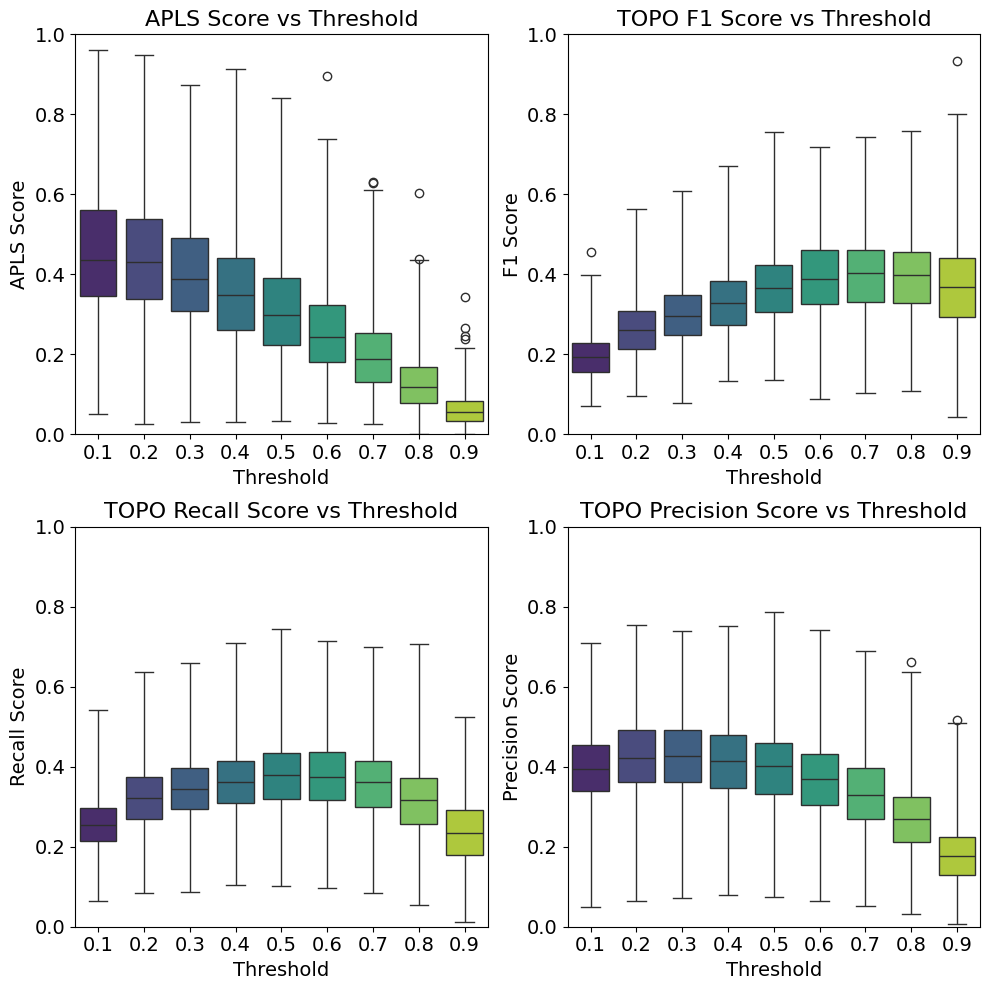

In [15]:
print('Seaborn Version', sns.__version__)

unet_apls_scores = np.load('unet_apls_scores.npy')
unet_topo_scores = np.load('unet_topo_scores.npy')
thresholds = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

# Prepare data for boxplot
apls_data    = [(threshold, score   ) for threshold, scores in zip(thresholds, unet_apls_scores) for score in scores]
topo_f1_data = [(threshold, score[0]) for threshold, scores in zip(thresholds, unet_topo_scores) for score in scores]
topo_p_data = [(threshold, score[1]) for threshold, scores in zip(thresholds, unet_topo_scores) for score in scores]
topo_r_data = [(threshold, score[2]) for threshold, scores in zip(thresholds, unet_topo_scores) for score in scores]

# Convert to structured array for easier plotting: float32 ('f4') instead of float16 ('f2')
apls_data    = np.array(apls_data, dtype=[('Threshold', 'f4'), ('APLS Score', 'f4')])
topo_f1_data = np.array(topo_f1_data, dtype=[('Threshold', 'f4'), ('TOPO F1 Score', 'f4')])
topo_p_data  = np.array(topo_p_data , dtype=[('Threshold', 'f4'), ('TOPO Precision Score', 'f4')])
topo_r_data  = np.array(topo_r_data , dtype=[('Threshold', 'f4'), ('TOPO Recall Score', 'f4')])

# Convert structured arrays to pandas DataFrames
apls_data_df = pd.DataFrame(apls_data)
topo_f1_data_df = pd.DataFrame(topo_f1_data)
topo_p_data_df = pd.DataFrame(topo_p_data)
topo_r_data_df = pd.DataFrame(topo_r_data)


# Plotting
with warnings.catch_warnings():
    warnings.simplefilter("ignore", FutureWarning)
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))

    title_size = 16
    label_size = 14
    tick_size = 14

    # APLS Score vs Threshold
    sns.boxplot(x='Threshold', y='APLS Score', data=apls_data_df, ax=axes[0,0], palette="viridis", legend=False, whis=3)
    axes[0,0].set_title('APLS Score vs Threshold', fontsize=title_size)
    axes[0,0].set_xlabel('Threshold', fontsize=label_size)
    axes[0,0].set_ylabel('APLS Score', fontsize=label_size)
    axes[0,0].set_ylim([0, 1])
    axes[0,0].tick_params(labelsize=tick_size)
    
    # TOPO F1 Score vs Threshold
    sns.boxplot(x='Threshold', y='TOPO F1 Score', data=topo_f1_data_df, ax=axes[0,1], palette="viridis", legend=False, whis=3)
    axes[0,1].set_title('TOPO F1 Score vs Threshold', fontsize=title_size)
    axes[0,1].set_xlabel('Threshold', fontsize=label_size)
    axes[0,1].set_ylabel('F1 Score', fontsize=label_size)
    axes[0,1].set_ylim([0, 1])
    axes[0,1].tick_params(labelsize=tick_size)

    
    # TOPO P Score vs Threshold
    sns.boxplot(x='Threshold', y='TOPO Precision Score', data=topo_p_data_df, ax=axes[1,1], palette="viridis", legend=False, whis=3)
    axes[1,1].set_title('TOPO Precision Score vs Threshold', fontsize=title_size)
    axes[1,1].set_xlabel('Threshold', fontsize=label_size)
    axes[1,1].set_ylabel('Precision Score', fontsize=label_size)
    axes[1,1].set_ylim([0, 1])
    axes[1,1].tick_params(labelsize=tick_size)

    # TOPO R Score vs Threshold
    sns.boxplot(x='Threshold', y='TOPO Recall Score', data=topo_r_data_df, ax=axes[1,0], palette="viridis", legend=False, whis=3)
    axes[1,0].set_title('TOPO Recall Score vs Threshold', fontsize=title_size)
    axes[1,0].set_xlabel('Threshold', fontsize=label_size)
    axes[1,0].set_ylabel('Recall Score', fontsize=label_size)
    axes[1,0].set_ylim([0, 1])
    axes[1,0].tick_params(labelsize=tick_size)

plt.tight_layout()
plt.show()

In [16]:
unet_apls_scores = np.load('unet_apls_scores.npy')
unet_topo_scores = np.load('unet_topo_scores.npy')
thresholds = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]

# Prepare data for boxplot
apls_data = [(threshold, score) for threshold, scores in zip(thresholds, unet_apls_scores) for score in scores]
topo_f1_data = [(threshold, score[0]) for threshold, scores in zip(thresholds, unet_topo_scores) for score in scores]
topo_p_data = [(threshold, score[1]) for threshold, scores in zip(thresholds, unet_topo_scores) for score in scores]
topo_r_data = [(threshold, score[2]) for threshold, scores in zip(thresholds, unet_topo_scores) for score in scores]

# Convert to pandas DataFrames
apls_data_df = pd.DataFrame(apls_data, columns=['Threshold', 'APLS Score'])
topo_f1_data_df = pd.DataFrame(topo_f1_data, columns=['Threshold', 'TOPO F1 Score'])
topo_p_data_df = pd.DataFrame(topo_p_data, columns=['Threshold', 'TOPO Precision Score'])
topo_r_data_df = pd.DataFrame(topo_r_data, columns=['Threshold', 'TOPO Recall Score'])

# Calculate means
apls_mean = apls_data_df.groupby('Threshold').mean().reset_index()
topo_f1_mean = topo_f1_data_df.groupby('Threshold').mean().reset_index()
topo_p_mean = topo_p_data_df.groupby('Threshold').mean().reset_index()
topo_r_mean = topo_r_data_df.groupby('Threshold').mean().reset_index()

# Merge all means into a single DataFrame
mean_scores = pd.merge(apls_mean, topo_p_mean, on='Threshold')
mean_scores = pd.merge(mean_scores, topo_r_mean, on='Threshold')
mean_scores = pd.merge(mean_scores, topo_f1_mean, on='Threshold')

mean_scores


,Threshold,APLS Score,TOPO Precision Score,TOPO Recall Score,TOPO F1 Score
0,0.1,0.455587,0.396072,0.257986,0.194850
1,0.2,0.449095,0.427171,0.323602,0.265237
2,0.3,0.406903,0.427251,0.348608,0.300128
3,0.4,0.361544,0.416878,0.365808,0.332374
4,0.5,0.316846,0.399868,0.379460,0.368586
5,0.6,0.265128,0.372061,0.377669,0.392713
6,0.7,0.203062,0.335763,0.360077,0.399594
7,0.8,0.130037,0.272573,0.317941,0.395998
8,0.9,0.063385,0.181051,0.238243,0.372067


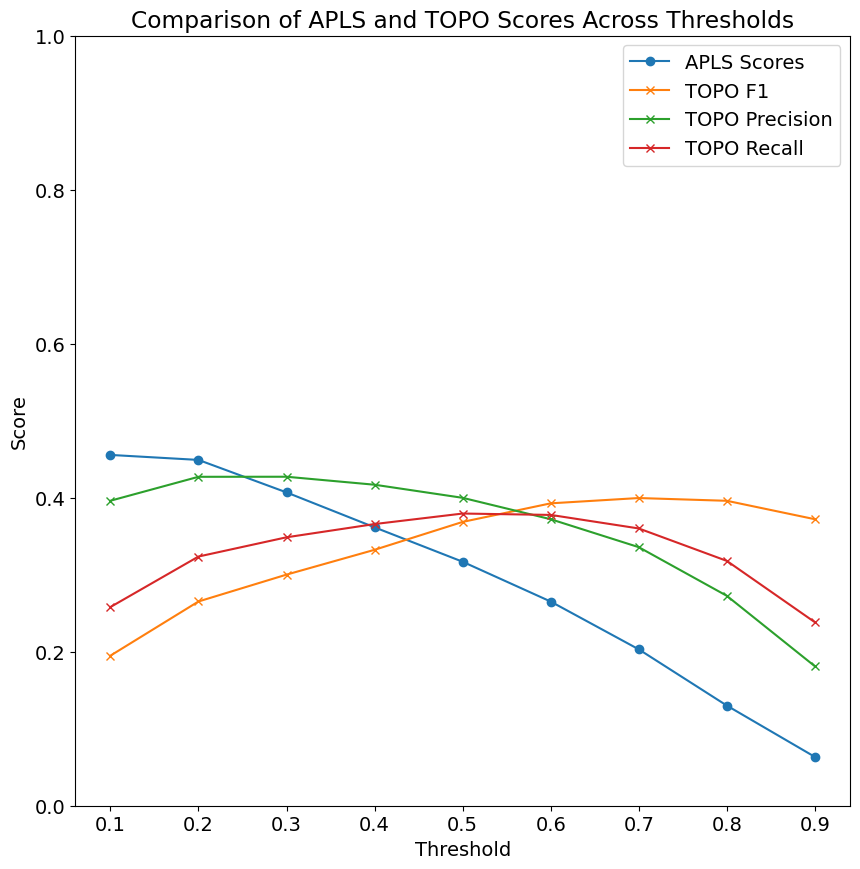

In [17]:
# Plotting
plt.rcParams.update({'font.size': 14})  # This will change the font size globally for all text
plt.figure(figsize=(10, 10))
apls_mean = unet_apls_scores.mean(axis=1, keepdims=True)
topo_mean = unet_topo_scores.mean(axis=1, keepdims=True)

topo_f1_scores = [score[0][0] for score in topo_mean]
topo_p_scores  = [score[0][1] for score in topo_mean]
topo_r_scores  = [score[0][2] for score in topo_mean]

# Plot APLS scores
plt.plot(thresholds, apls_mean, marker='o', linestyle='-', label='APLS Scores')
# Plot TOPO scores
plt.plot(thresholds, topo_f1_scores, marker='x', linestyle='-', label='TOPO F1')
plt.plot(thresholds, topo_p_scores , marker='x', linestyle='-', label='TOPO Precision')
plt.plot(thresholds, topo_r_scores , marker='x', linestyle='-', label='TOPO Recall')

# Add labels, title and legend
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.ylim([0, 1])
plt.title('Comparison of APLS and TOPO Scores Across Thresholds')
plt.legend()
plt.show()

## Testing

In [18]:
%%script echo
with open(os.path.join(pickel_dir, 'X_test_128.pkl'), 'rb') as f:
    X_test = pickle.load(f)

with open(os.path.join(pickel_dir, 'y_test_128.pkl'), 'rb') as f:
    y_test = pickle.load(f)

In [19]:
%%script echo

from keras.models import load_model

IMG_WIDTH = IMG_HEIGHT = 128

loaded_model = load_model('unet_model_1_epoch15.h5')

datasets = [('Test', X_test, y_test)]
# Generate predictions for all validation images
predicted_masks = []
for idx in range(len(X_test)):
    pred_image = X_test[idx].astype(np.float32).reshape((1, IMG_WIDTH, IMG_HEIGHT, 3))
    prediction = loaded_model.predict(pred_image)
    predicted_masks.append(prediction.squeeze())  # Remove batch dimension

unet_predicted_masks = np.array(predicted_masks)  # Convert list to NumPy array if not already

# Define the path to save the masks
predicted_masks_path = 'unet_predicted_masks_test.npy'

# Save the predicted masks
np.save(predicted_masks_path, unet_predicted_masks)

unet_predicted_masks = np.load('unet_predicted_masks_test.npy')
mask = unet_predicted_masks[0:0+16]
mask_group = np.array(mask)
combined_mask = combine_arrays(mask_group, 4, 4)
plt.imshow(combined_mask, cmap='gray')

In [20]:
%%script echo

ground_truth_masks = y_test

predicted_mask_groups = []
gt_mask_groups = []

for i in range(0, len(ground_truth_masks), 16):
    # Combine every 16 masks for predictions and ground truth
    mask_group = np.array(unet_predicted_masks[i:i+16])
    gt_mask_group = np.squeeze(ground_truth_masks[i:i+16], axis=-1)
    
    combined_mask = combine_arrays(mask_group, 4, 4)
    combined_gt_mask = combine_arrays(gt_mask_group, 4, 4)

    predicted_mask_groups.append(combined_mask)
    gt_mask_groups.append(combined_gt_mask)

np.save('predicted_mask_group_test', predicted_mask_groups)
np.save('gt_mask_group_test', gt_mask_groups)

In [21]:
%%script echo
predicted_mask_groups = np.load('predicted_mask_group_test.npy')
gt_mask_groups = np.load('gt_mask_group_test.npy')

# Generate a list of thresholds
thresholds = [0.6, 0.7, 0.8]
apls_scores = []
topo_scores = []

# Apply each threshold to the predicted masks and evaluate
for threshold in thresholds:
    binarized_predicted_masks = [(mask > threshold).astype(np.float32) for mask in predicted_mask_groups]
    
    # Initialize score lists for this threshold
    threshold_apls_scores = []
    threshold_topo_scores = []
    
    # Iterate over binarized_predicted_masks and ground_truth_masks in pairs
    for i in range(0, len(gt_mask_groups)):
        combined_mask = binarized_predicted_masks[i]
        graph = create_road_network_graph_optimized(combined_mask)
        graph = contracting_nodes(graph, min_distance=20)

        gt_mask_group = gt_mask_groups[i]
        gt_graph = create_road_network_graph_optimized(gt_mask_group)
        gt_graph = contracting_nodes(gt_graph, min_distance=20)
        
        apls_score = apls(gt_graph, graph)
        topo_score = TOPO(gt_graph, graph)
            
        threshold_apls_scores.append(apls_score)
        threshold_topo_scores.append(topo_score)
        
    apls_scores.append(threshold_apls_scores)
    topo_scores.append(threshold_topo_scores)

In [22]:
%%script echo
#unet_apls_scores = np.array(apls_scores)
#unet_topo_scores = np.array(topo_scores)

# Define the path to save the masks
unet_apls_scores_path = 'unet_apls_scores_test.npy'
unet_topo_scores_path = 'unet_topo_scores_test.npy'

# Save the predicted masks
np.save(unet_apls_scores_path, unet_apls_scores)
np.save(unet_topo_scores_path, unet_topo_scores)

Seaborn Version 0.13.2


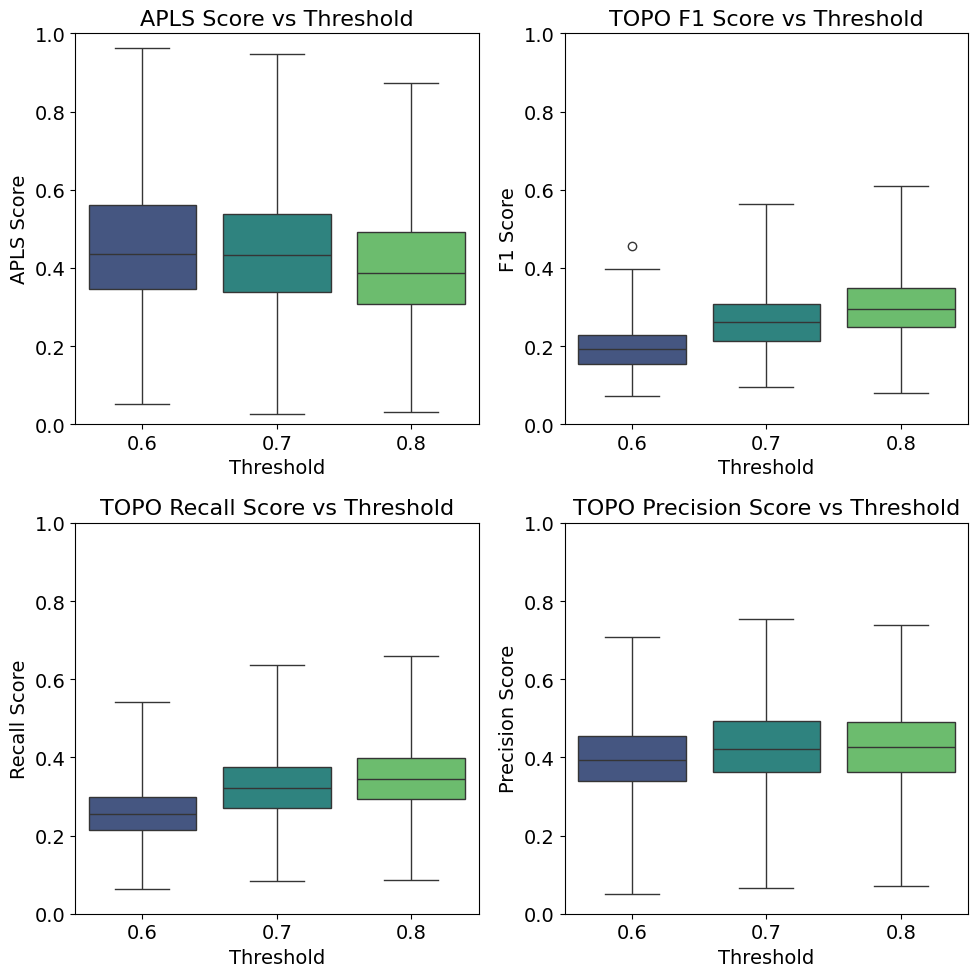

In [23]:
print('Seaborn Version', sns.__version__)

unet_apls_scores = np.load('unet_apls_scores_test.npy')
unet_topo_scores = np.load('unet_topo_scores_test.npy')
thresholds = [0.6, 0.7, 0.8]

# Prepare data for boxplot
apls_data    = [(threshold, score   ) for threshold, scores in zip(thresholds, unet_apls_scores) for score in scores]
topo_f1_data = [(threshold, score[0]) for threshold, scores in zip(thresholds, unet_topo_scores) for score in scores]
topo_p_data = [(threshold, score[1]) for threshold, scores in zip(thresholds, unet_topo_scores) for score in scores]
topo_r_data = [(threshold, score[2]) for threshold, scores in zip(thresholds, unet_topo_scores) for score in scores]

# Convert to structured array for easier plotting: float32 ('f4') instead of float16 ('f2')
apls_data    = np.array(apls_data, dtype=[('Threshold', 'f4'), ('APLS Score', 'f4')])
topo_f1_data = np.array(topo_f1_data, dtype=[('Threshold', 'f4'), ('TOPO F1 Score', 'f4')])
topo_p_data  = np.array(topo_p_data , dtype=[('Threshold', 'f4'), ('TOPO Precision Score', 'f4')])
topo_r_data  = np.array(topo_r_data , dtype=[('Threshold', 'f4'), ('TOPO Recall Score', 'f4')])

# Convert structured arrays to pandas DataFrames
apls_data_df = pd.DataFrame(apls_data)
topo_f1_data_df = pd.DataFrame(topo_f1_data)
topo_p_data_df = pd.DataFrame(topo_p_data)
topo_r_data_df = pd.DataFrame(topo_r_data)


# Plotting
with warnings.catch_warnings():
    warnings.simplefilter("ignore", FutureWarning)
    fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(10, 10))

    title_size = 16
    label_size = 14
    tick_size = 14

    # APLS Score vs Threshold
    sns.boxplot(x='Threshold', y='APLS Score', data=apls_data_df, ax=axes[0,0], palette="viridis", legend=False, whis=3)
    axes[0,0].set_title('APLS Score vs Threshold', fontsize=title_size)
    axes[0,0].set_xlabel('Threshold', fontsize=label_size)
    axes[0,0].set_ylabel('APLS Score', fontsize=label_size)
    axes[0,0].set_ylim([0, 1])
    axes[0,0].tick_params(labelsize=tick_size)
    
    # TOPO F1 Score vs Threshold
    sns.boxplot(x='Threshold', y='TOPO F1 Score', data=topo_f1_data_df, ax=axes[0,1], palette="viridis", legend=False, whis=3)
    axes[0,1].set_title('TOPO F1 Score vs Threshold', fontsize=title_size)
    axes[0,1].set_xlabel('Threshold', fontsize=label_size)
    axes[0,1].set_ylabel('F1 Score', fontsize=label_size)
    axes[0,1].set_ylim([0, 1])
    axes[0,1].tick_params(labelsize=tick_size)

    
    # TOPO P Score vs Threshold
    sns.boxplot(x='Threshold', y='TOPO Precision Score', data=topo_p_data_df, ax=axes[1,1], palette="viridis", legend=False, whis=3)
    axes[1,1].set_title('TOPO Precision Score vs Threshold', fontsize=title_size)
    axes[1,1].set_xlabel('Threshold', fontsize=label_size)
    axes[1,1].set_ylabel('Precision Score', fontsize=label_size)
    axes[1,1].set_ylim([0, 1])
    axes[1,1].tick_params(labelsize=tick_size)

    # TOPO R Score vs Threshold
    sns.boxplot(x='Threshold', y='TOPO Recall Score', data=topo_r_data_df, ax=axes[1,0], palette="viridis", legend=False, whis=3)
    axes[1,0].set_title('TOPO Recall Score vs Threshold', fontsize=title_size)
    axes[1,0].set_xlabel('Threshold', fontsize=label_size)
    axes[1,0].set_ylabel('Recall Score', fontsize=label_size)
    axes[1,0].set_ylim([0, 1])
    axes[1,0].tick_params(labelsize=tick_size)

plt.tight_layout()
plt.show()

In [24]:
# Prepare data for boxplot
apls_data = [(threshold, score) for threshold, scores in zip(thresholds, unet_apls_scores) for score in scores]
topo_f1_data = [(threshold, score[0]) for threshold, scores in zip(thresholds, unet_topo_scores) for score in scores]
topo_p_data = [(threshold, score[1]) for threshold, scores in zip(thresholds, unet_topo_scores) for score in scores]
topo_r_data = [(threshold, score[2]) for threshold, scores in zip(thresholds, unet_topo_scores) for score in scores]

# Convert to pandas DataFrames
apls_data_df = pd.DataFrame(apls_data, columns=['Threshold', 'APLS Score'])
topo_f1_data_df = pd.DataFrame(topo_f1_data, columns=['Threshold', 'TOPO F1 Score'])
topo_p_data_df = pd.DataFrame(topo_p_data, columns=['Threshold', 'TOPO Precision Score'])
topo_r_data_df = pd.DataFrame(topo_r_data, columns=['Threshold', 'TOPO Recall Score'])

# Calculate means
apls_mean = apls_data_df.groupby('Threshold').mean().reset_index()
topo_f1_mean = topo_f1_data_df.groupby('Threshold').mean().reset_index()
topo_p_mean = topo_p_data_df.groupby('Threshold').mean().reset_index()
topo_r_mean = topo_r_data_df.groupby('Threshold').mean().reset_index()

# Merge all means into a single DataFrame
mean_scores = pd.merge(apls_mean, topo_p_mean, on='Threshold')
mean_scores = pd.merge(mean_scores, topo_r_mean, on='Threshold')
mean_scores = pd.merge(mean_scores, topo_f1_mean, on='Threshold')
mean_scores

,Threshold,APLS Score,TOPO Precision Score,TOPO Recall Score,TOPO F1 Score
0,0.6,0.455587,0.396072,0.257986,0.194850
1,0.7,0.449095,0.427171,0.323602,0.265237
2,0.8,0.406903,0.427251,0.348608,0.300128


In [25]:
%%script echo
# Plotting
plt.rcParams.update({'font.size': 14})  # This will change the font size globally for all text
plt.figure(figsize=(10, 10))
apls_mean = unet_apls_scores.mean(axis=1, keepdims=True)
topo_mean = unet_topo_scores.mean(axis=1, keepdims=True)

topo_f1_scores = [score[0][0] for score in topo_mean]
topo_p_scores  = [score[0][1] for score in topo_mean]
topo_r_scores  = [score[0][2] for score in topo_mean]

# Plot APLS scores
plt.plot(thresholds, apls_mean, marker='o', linestyle='-', label='APLS Scores')
# Plot TOPO scores
plt.plot(thresholds, topo_f1_scores, marker='x', linestyle='-', label='TOPO F1')
plt.plot(thresholds, topo_p_scores , marker='x', linestyle='-', label='TOPO Precision')
plt.plot(thresholds, topo_r_scores , marker='x', linestyle='-', label='TOPO Recall')

# Add labels, title and legend
plt.xlabel('Threshold')
plt.ylabel('Score')
plt.ylim([0, 1])
plt.title('Comparison of APLS and TOPO Scores Across Thresholds')
plt.legend()
plt.show()

## Statistical Testing

In [26]:
unet_apls_scores_test = np.load('unet_apls_scores_test.npy')
unet_topo_scores_test = np.load('unet_topo_scores_test.npy')

unet_apls_scores = np.load('unet_apls_scores.npy')
unet_topo_scores = np.load('unet_topo_scores.npy')
unet_topo_scores.shape

(9, 622, 3)

In [27]:
import scipy.stats as stats
np.random.seed(0)  # Seed for reproducibility

# Extract the scores for thresholds 0.6, 0.7, and 0.8
validation_threshold_indices = [5, 6, 7]
test_threshold_indices = [0, 1, 2]

'''
# Flatten the arrays to get a single set of scores for each metric at each threshold
validation_apls_scores = unet_apls_scores.flatten()[3:100:]
validation_topo_scores = unet_topo_scores[validation_threshold_indices, :, :].flatten()[3:100:]
test_apls_scores = unet_apls_scores_test.flatten()[3:100:]
test_topo_scores = unet_topo_scores_test[test_threshold_indices, :, :].flatten()[3:100:]

# Perform the Shapiro-Wilk test for normality
sw_validation_apls = stats.shapiro(validation_apls_scores)
sw_validation_topo = stats.shapiro(validation_topo_scores)
sw_test_apls = stats.shapiro(test_apls_scores)
sw_test_topo = stats.shapiro(test_topo_scores)

# A p-value greater than the chosen alpha level (e.g., 0.05) indicates normal distribution
print('APLS Validation:', sw_validation_apls)
print('TOPO Validation:', sw_validation_topo)
print('APLS Test:', sw_test_apls)
print('TOPO Test:', sw_test_topo)
'''

validation_apls_scores = unet_apls_scores[5].flatten()
validation_topo_scores = unet_topo_scores[0::][validation_threshold_indices, :, :].flatten()
test_apls_scores = unet_apls_scores_test[0].flatten()
test_topo_scores = unet_topo_scores_test[0::][test_threshold_indices, :, :].flatten()

# Perform the Shapiro-Wilk test for normality
sw_validation_apls = stats.shapiro(validation_apls_scores)
sw_validation_topo = stats.shapiro(validation_topo_scores)
sw_test_apls = stats.shapiro(test_apls_scores)
sw_test_topo = stats.shapiro(test_topo_scores)

# A p-value greater than the chosen alpha level (e.g., 0.05) indicates normal distribution
print('APLS Validation:', sw_validation_apls)
print('TOPO Validation:', sw_validation_topo)
print('APLS Test:', sw_test_apls)
print('TOPO Test:', sw_test_topo)

APLS Validation: ShapiroResult(statistic=0.934855151712498, pvalue=7.818050936674153e-16)
TOPO Validation: ShapiroResult(statistic=0.997117864182652, pvalue=6.8959917855814404e-09)
APLS Test: ShapiroResult(statistic=0.9848958916551371, pvalue=4.843186273471822e-06)
TOPO Test: ShapiroResult(statistic=0.9878553016025305, pvalue=1.494191598616972e-21)


/var/folders/br/czgt0zz514dfx5f0w14p4czr0000gn/T/ipykernel_20728/3542562638.py:35: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5598.
  sw_validation_topo = stats.shapiro(validation_topo_scores)
/var/folders/br/czgt0zz514dfx5f0w14p4czr0000gn/T/ipykernel_20728/3542562638.py:37: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 5598.
  sw_test_topo = stats.shapiro(test_topo_scores)


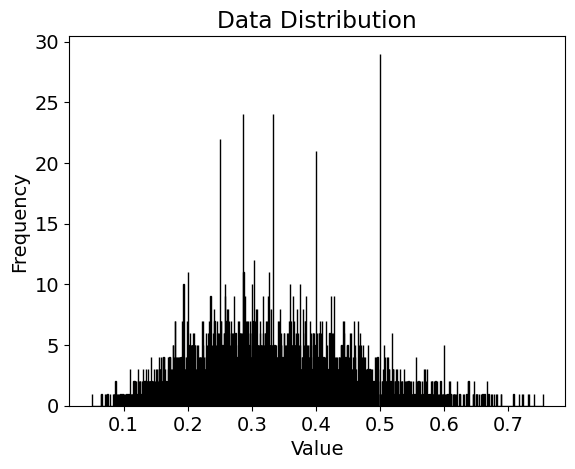

In [28]:
data = test_topo_scores

# Create histogram
plt.hist(data, bins=5000, edgecolor='black')

# Add titles and labels
plt.title('Data Distribution')
plt.xlabel('Value')
plt.ylabel('Frequency')

# Show the plot
plt.show()

## Presention

In [29]:
predicted_mask_groups = np.load('predicted_mask_group_test.npy')
gt_mask_groups = np.load('gt_mask_group_test.npy')


threshold = 0.7
index = random.randint(0, len(gt_mask_groups))

mask = predicted_mask_groups[index]
binarized_predicted_masks = (mask > threshold).astype(np.float32)
combined_mask = binarized_predicted_masks
graph = create_road_network_graph_optimized(combined_mask)
graph = contracting_nodes(graph, min_distance=20)

gt_mask_group = gt_mask_groups[index]
gt_graph = create_road_network_graph_optimized(gt_mask_group)
gt_graph = contracting_nodes(gt_graph, min_distance=20)

1/1 [==============================] - 0s 125ms/step


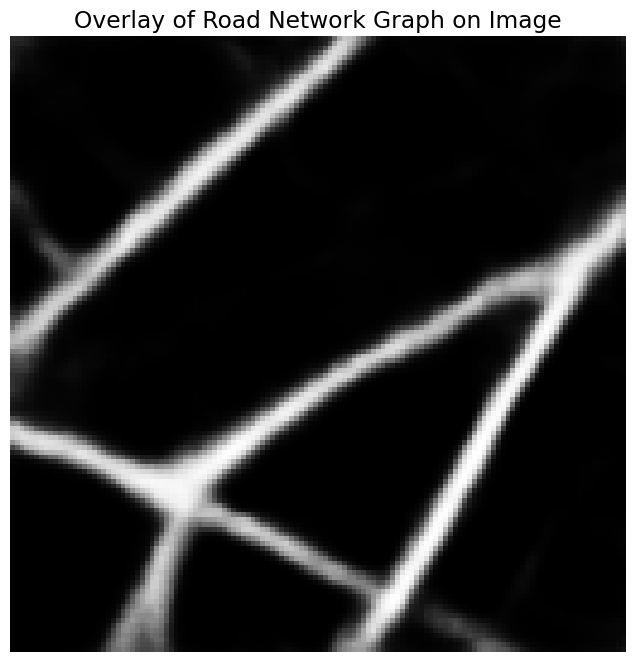

In [32]:
from keras.models import load_model
IMG_WIDTH = IMG_HEIGHT = 128
loaded_model = load_model('unet_model_1_epoch15.h5')
datasets = [('Train', X_validation, y_validation)]
# Generate predictions for all validation images
predicted_masks = []
for idx in range(1):
    idx = 11
    pred_image = X_validation[idx].astype(np.float32).reshape((1, IMG_WIDTH, IMG_HEIGHT, 3))
    prediction = loaded_model.predict(pred_image)
    predicted_masks.append(prediction.squeeze())  # Remove batch dimension

unet_predicted_masks = np.array(predicted_masks)  # Convert list to NumPy array if not already
plot_road_network_overlay(unet_predicted_masks[0], nx.Graph(), [], [])

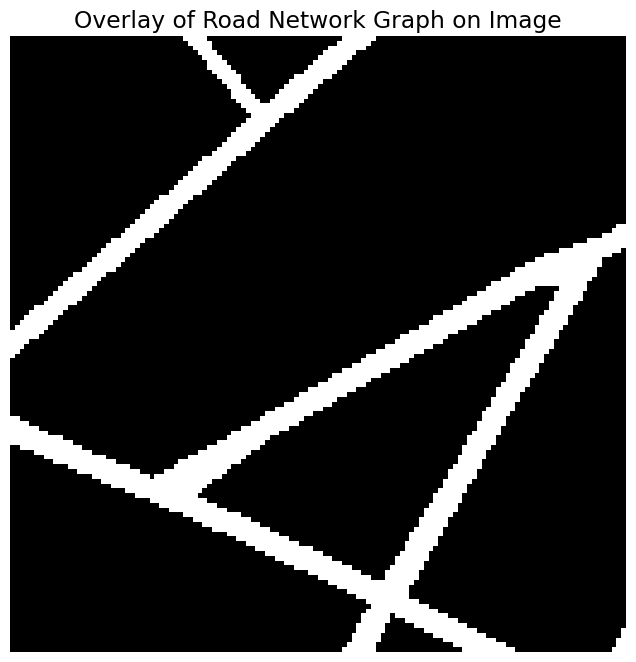

In [33]:
from keras.models import load_model
IMG_WIDTH = IMG_HEIGHT = 128
loaded_model = load_model('unet_model_1_epoch15.h5')
datasets = [('Train', X_validation, y_validation)]
# Generate predictions for all validation images
predicted_masks = []
for idx in range(1):
    idx = 11
    pred_image = y_validation[idx].astype(np.float32).reshape((1, IMG_WIDTH, IMG_HEIGHT, 1))
    prediction = y_validation[idx]# loaded_model.predict(pred_image)
    predicted_masks.append(prediction.squeeze())  # Remove batch dimension

unet_predicted_masks = np.array(predicted_masks)  # Convert list to NumPy array if not already
plot_road_network_overlay(unet_predicted_masks[0], nx.Graph(), [], [])

In [34]:
mask_extensions = ['.jpg']
mask_filenames = [filename for filename in os.listdir(orig_train_dir) if os.path.splitext(filename)[-1] in mask_extensions]


def resize_image(image_path, size=(512, 512)):
    image = cv2.imread(image_path)
    return cv2.resize(image, size)

def split_into_grids(image, grid_size=(128, 128)):
    h, w, _ = image.shape
    return [image[x:x+grid_size[0], y:y+grid_size[1]] for x in range(0, h, grid_size[0]) for y in range(0, w, grid_size[1])]

def recombine_grids(grids):
    num_grids_side = int(np.sqrt(len(grids)))
    grid_h, grid_w = grids[0].shape[0], grids[0].shape[1]  # Assuming all grids have the same shape
    recombined_image = np.zeros((grid_h*num_grids_side, grid_w*num_grids_side), dtype=grids[0].dtype)

    for count, grid in enumerate(grids):
        i = count // num_grids_side
        j = count % num_grids_side
        recombined_image[i*grid_h:(i+1)*grid_h, j*grid_w:(j+1)*grid_w] = grid
    return recombined_image

../datasets/deepglobe/train/original_train/18309_mask.png
1/1 [==============================] - 0s 18ms/step


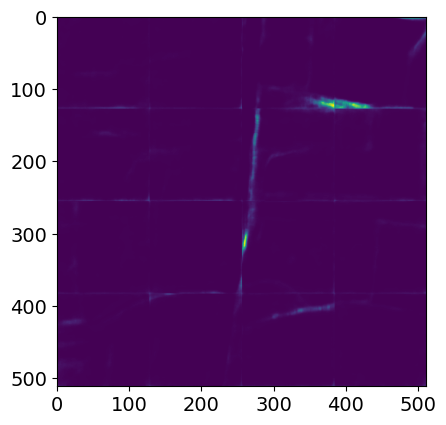

In [35]:
from keras.models import load_model

# Step 1: Resize images
image_path = os.path.join(orig_train_dir, random.choice(mask_filenames))
image_path = os.path.join(orig_train_dir, '18309_sat.jpg')
mask_path  = image_path.replace('sat.jpg', 'mask.png')
print(mask_path)
satellite_image_resized = resize_image(image_path)
mask_resized = resize_image(mask_path)[:,:,2]  # This keeps only the Red channel
# Step 2: Split the resized image into 128x128 grids
satellite_image_grids = split_into_grids(satellite_image_resized)
# Step 3: Load the model and predict on each grid
IMG_WIDTH = IMG_HEIGHT = 128
loaded_model = load_model('unet_model_1_epoch15.h5')
predicted_grids = []
for grid in satellite_image_grids:
    reshaped_grid = grid.astype(np.float32).reshape((1, IMG_WIDTH, IMG_HEIGHT, 3))
    predicted_grid = loaded_model.predict(reshaped_grid / 255.0)
    predicted_grids.append(predicted_grid.squeeze())

# Step 4: Recombine the predicted grids into the original format
recombined_image = recombine_grids(predicted_grids)
plt.imshow(recombined_image)


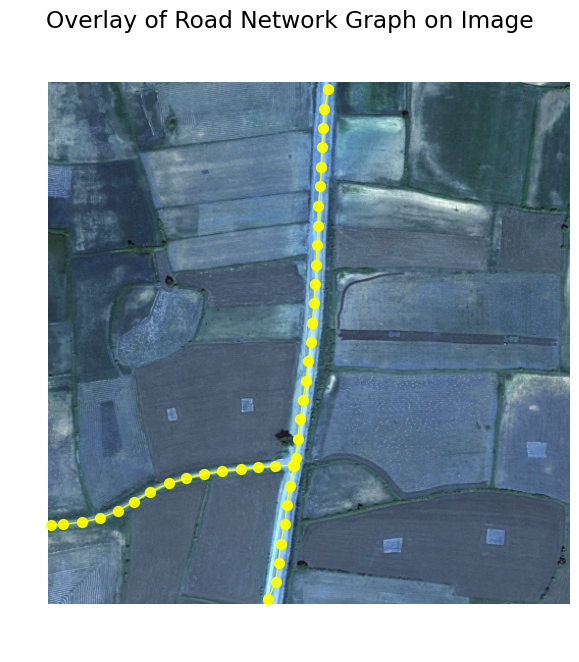

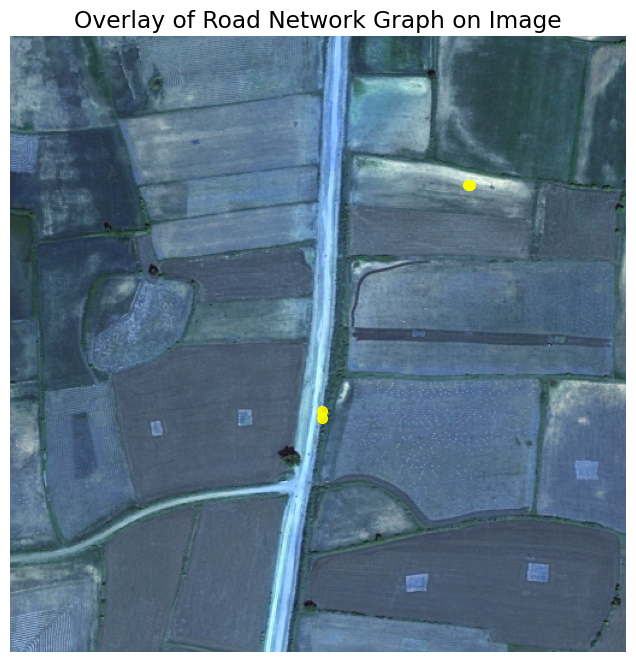

In [44]:
threshold = 0.7
combined_mask = (np.array(recombined_image) > threshold).astype(np.float32)
graph = create_road_network_graph_optimized(combined_mask)
graph = contracting_nodes(graph, min_distance=20)

gt_mask_group = mask_resized
gt_graph = create_road_network_graph_optimized(gt_mask_group)
gt_graph = contracting_nodes(gt_graph, min_distance=20)
plot_road_network_overlay(satellite_image_resized, gt_graph, [],[])
plot_road_network_overlay(satellite_image_resized, graph, [],[])

In [45]:
apls_score = apls(gt_graph, graph)
topo_score = TOPO(gt_graph, graph)
print(apls_score, topo_score)

0.0 (0.0, 0.0, 0)


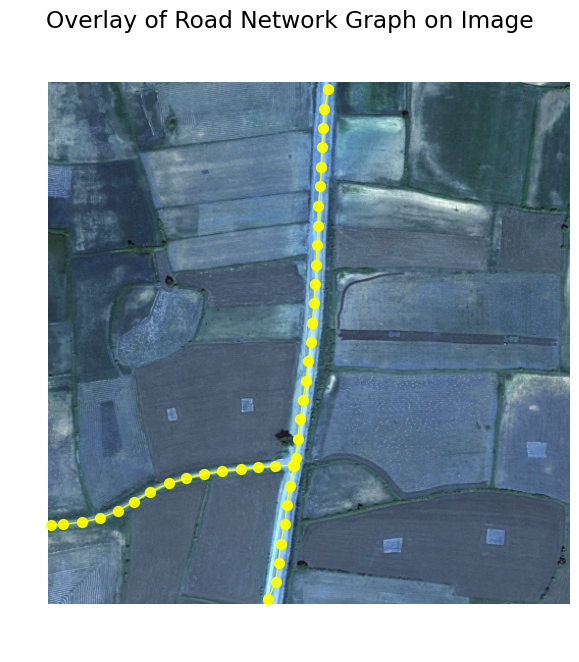

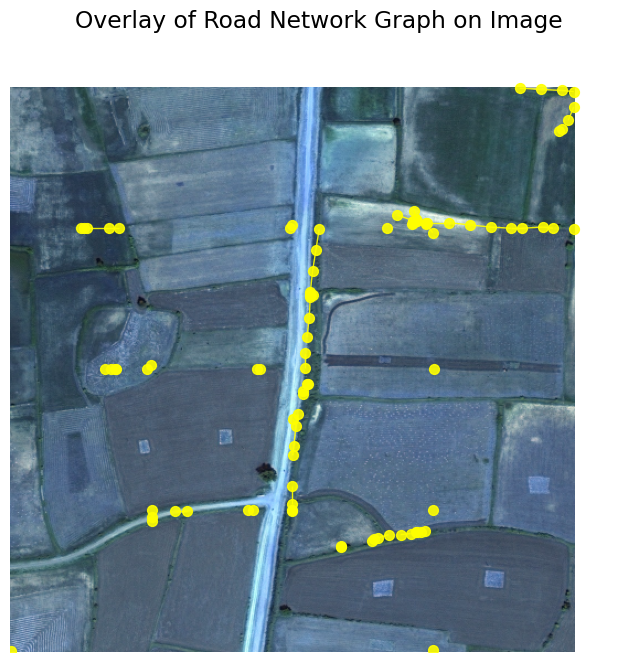

In [46]:
threshold = 0.1
combined_mask = (np.array(recombined_image) > threshold).astype(np.float32)
graph = create_road_network_graph_optimized(combined_mask)
graph = contracting_nodes(graph, min_distance=20)

gt_mask_group = mask_resized
gt_graph = create_road_network_graph_optimized(gt_mask_group)
gt_graph = contracting_nodes(gt_graph, min_distance=20)
plot_road_network_overlay(satellite_image_resized, gt_graph, [],[])
plot_road_network_overlay(satellite_image_resized, graph, [],[])

In [47]:
apls_score = apls(gt_graph, graph)
topo_score = TOPO(gt_graph, graph)
print(apls_score, topo_score)

0.0 (0.0421, 0.0909, 0.0576)


In [ ]:
# ../datasets/deepglobe/train/original_train/971228_mask.png

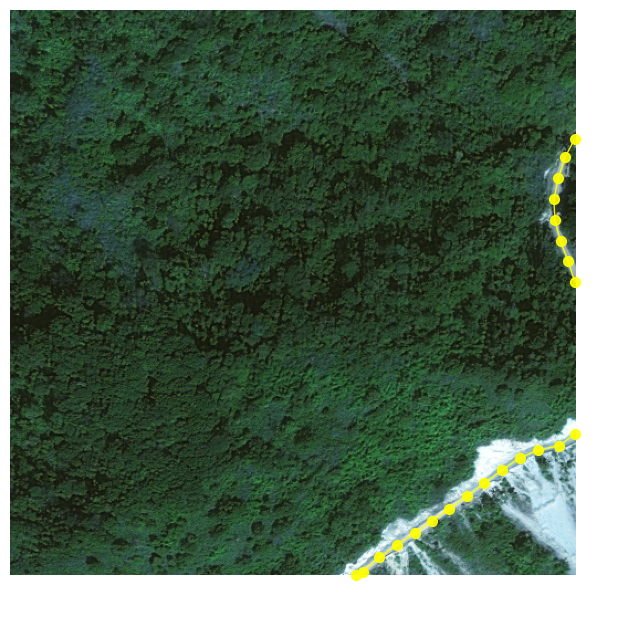

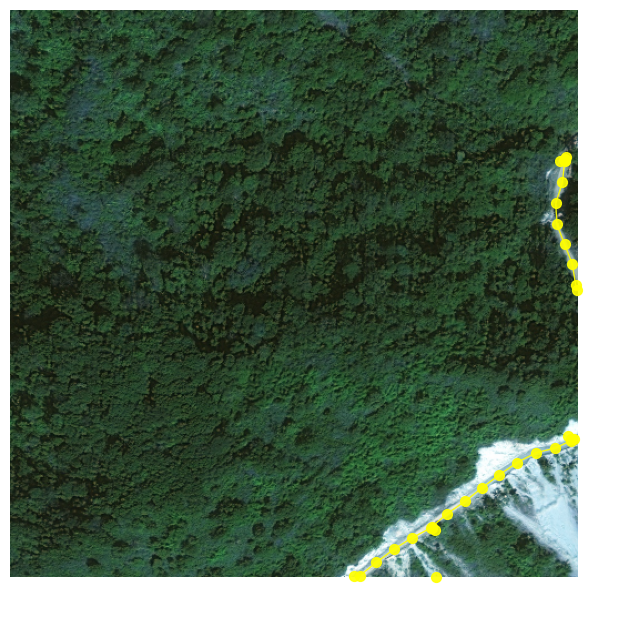

In [335]:

threshold = 0.1
combined_mask = (np.array(recombined_image) > threshold).astype(np.float32)
graph = create_road_network_graph_optimized(combined_mask)
graph = contracting_nodes(graph, min_distance=20)

gt_mask_group = mask_resized
gt_graph = create_road_network_graph_optimized(gt_mask_group)
gt_graph = contracting_nodes(gt_graph, min_distance=20)
plot_road_network_overlay(satellite_image_resized, gt_graph, [],[])
plot_road_network_overlay(satellite_image_resized, graph, [],[])

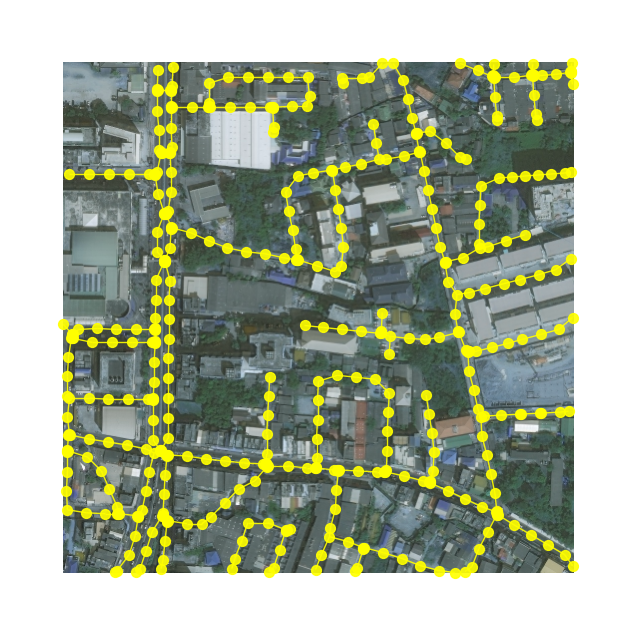

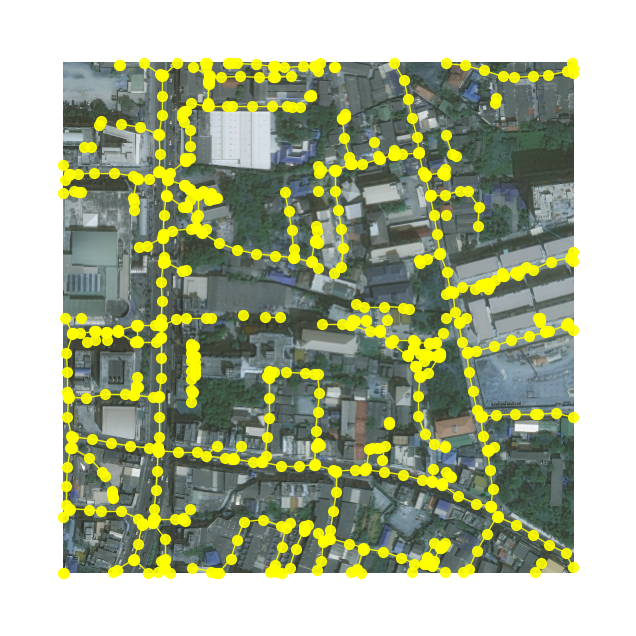

In [288]:
#../datasets/deepglobe/train/original_train/356917_mask.png
threshold = 0.1
combined_mask = (np.array(recombined_image) > threshold).astype(np.float32)
graph = create_road_network_graph_optimized(combined_mask)
graph = contracting_nodes(graph, min_distance=20)
gt_mask_group = mask_resized
gt_graph = create_road_network_graph_optimized(gt_mask_group)
gt_graph = contracting_nodes(gt_graph, min_distance=20)
plot_road_network_overlay(satellite_image_resized, gt_graph, [],[])
plot_road_network_overlay(satellite_image_resized, graph, [],[])

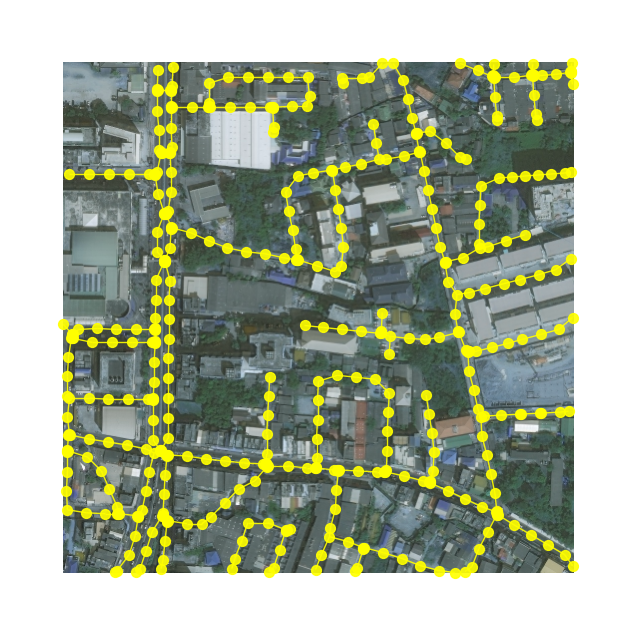

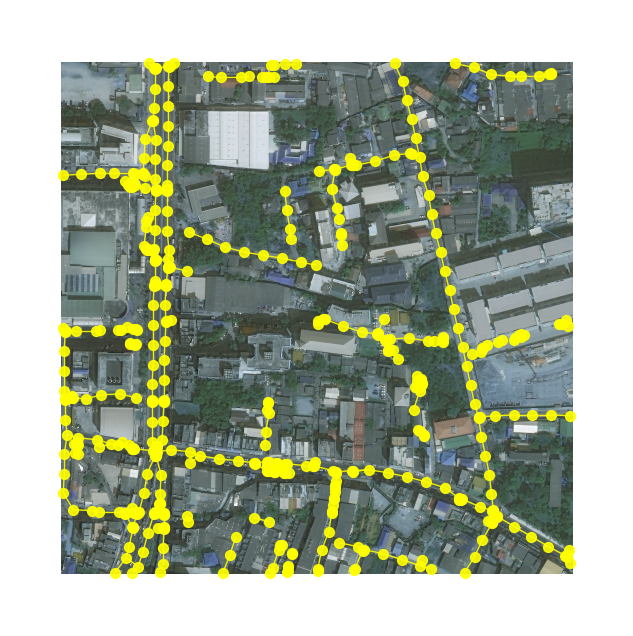

In [291]:
#../datasets/deepglobe/train/original_train/356917_mask.png
threshold = 0.5
combined_mask = (np.array(recombined_image) > threshold).astype(np.float32)
graph = create_road_network_graph_optimized(combined_mask)
graph = contracting_nodes(graph, min_distance=20)
gt_mask_group = mask_resized
gt_graph = create_road_network_graph_optimized(gt_mask_group)
gt_graph = contracting_nodes(gt_graph, min_distance=20)
plot_road_network_overlay(satellite_image_resized, gt_graph, [],[])
plot_road_network_overlay(satellite_image_resized, graph, [],[])

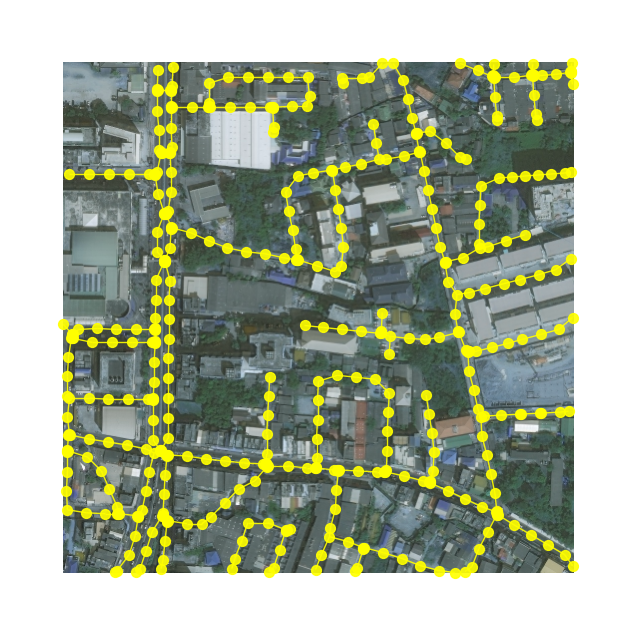

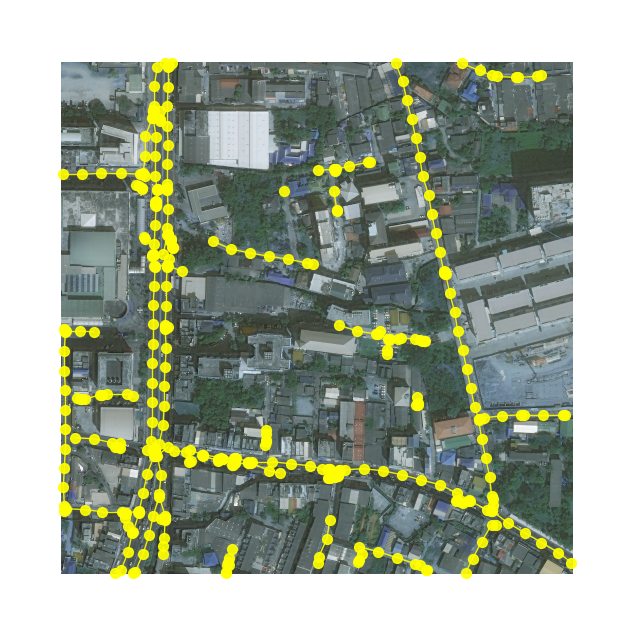

In [290]:
#../datasets/deepglobe/train/original_train/356917_mask.png
threshold = 0.7
combined_mask = (np.array(recombined_image) > threshold).astype(np.float32)
graph = create_road_network_graph_optimized(combined_mask)
graph = contracting_nodes(graph, min_distance=20)
gt_mask_group = mask_resized
gt_graph = create_road_network_graph_optimized(gt_mask_group)
gt_graph = contracting_nodes(gt_graph, min_distance=20)
plot_road_network_overlay(satellite_image_resized, gt_graph, [],[])
plot_road_network_overlay(satellite_image_resized, graph, [],[])

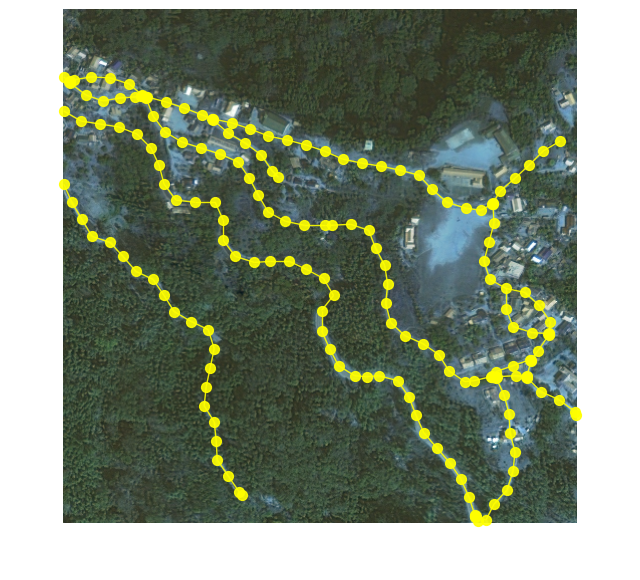

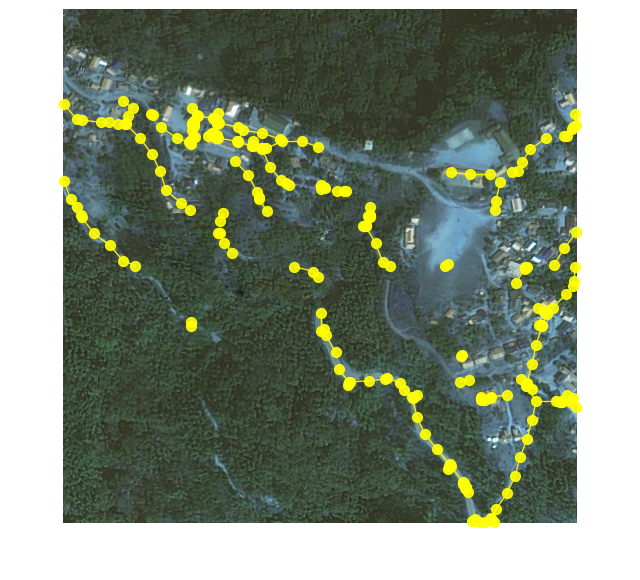

In [285]:
# ../datasets/deepglobe/train/original_train/216610_mask.png
threshold = 0.1
combined_mask = (np.array(recombined_image) > threshold).astype(np.float32)
graph = create_road_network_graph_optimized(combined_mask)
graph = contracting_nodes(graph, min_distance=20)
gt_mask_group = mask_resized
gt_graph = create_road_network_graph_optimized(gt_mask_group)
gt_graph = contracting_nodes(gt_graph, min_distance=20)
plot_road_network_overlay(satellite_image_resized, gt_graph, [],[])
plot_road_network_overlay(satellite_image_resized, graph, [],[])